# Prices prediction - Clustering

# Imports

In [32]:
import pandas as pd
import numpy as np
import seaborn as sns
from collections import Counter
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans, DBSCAN
from sklearn.neighbors import NearestNeighbors

In [2]:
import warnings
warnings.filterwarnings('ignore')

In [3]:
DEBUG = False
DEBUG_ROWS = 200

In [4]:
sns.set()

# Constants

In [5]:
DATASET_GITHUB_MAIN_URL = "https://raw.githubusercontent.com/motimol/ds_2024_project/main/{filename}"
CLUSTERING_DATA_URL = DATASET_GITHUB_MAIN_URL.format(filename="clustering_data.csv")

# Initial View and Discovery

In [6]:
df = pd.read_csv(CLUSTERING_DATA_URL, index_col=0)

In [7]:
if DEBUG:
  indecies = np.random.choice(df.shape[0], DEBUG_ROWS, replace=False)
  df = df.iloc[indecies,:]

In [8]:
df.head()

,feature 1,feature 2,feature 3,feature 4,feature 5,feature 6,feature 7,feature 8,feature 9,feature 10
0,-1.784220,9.139177,2.517077,-6.691300,3.332583,-6.189314,-8.294717,-5.527558,-9.150377,-3.437419
1,4.513056,-6.242134,-9.764999,8.975386,0.213133,-5.610271,6.194787,-0.247325,-1.000023,-9.091131
2,1.076570,-6.806062,-11.354346,11.589776,1.223487,-4.481565,5.119435,-0.036395,-2.308850,-5.820222
3,-0.203146,-6.098289,10.389102,-3.527880,-6.376361,3.444334,-0.331659,-3.784060,-6.922082,-3.463537
4,-4.488164,9.539276,0.414895,-3.298754,4.835677,-6.927819,-9.123490,-3.135282,-10.179017,-3.273429


In [9]:
df.describe()

,feature 1,feature 2,feature 3,feature 4,feature 5,feature 6,feature 7,feature 8,feature 9,feature 10
count,2500.000000,2500.000000,2500.000000,2500.000000,2500.000000,2500.000000,2500.000000,2500.000000,2500.000000,2500.000000
mean,-0.058067,-0.652801,0.340646,-0.657468,-0.140713,-3.201743,-0.924817,-0.042125,-5.532473,-4.036382
std,4.985677,6.041751,7.507013,5.203314,3.240087,4.256396,7.213071,3.969351,4.101869,2.805283
min,-10.766832,-11.994511,-13.340450,-9.713562,-9.081393,-11.339145,-11.861602,-8.073032,-12.742542,-11.304777
25%,-3.156292,-5.558896,-7.589439,-4.771484,-1.773954,-6.712819,-7.586765,-3.609371,-8.919789,-6.126161
50%,-0.774796,-0.793572,2.038051,-1.542587,0.529864,-5.118522,-3.083608,-0.396338,-7.425201,-4.336525
75%,3.255897,1.480191,7.622533,1.259217,2.143197,1.111768,5.737658,3.519774,-1.306876,-2.232566
max,12.238539,13.707162,12.448849,12.053077,6.302356,6.789144,13.841431,9.729432,4.325894,3.408461


In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2500 entries, 0 to 2499
Data columns (total 10 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   feature 1   2500 non-null   float64
 1   feature 2   2500 non-null   float64
 2   feature 3   2500 non-null   float64
 3   feature 4   2500 non-null   float64
 4   feature 5   2500 non-null   float64
 5   feature 6   2500 non-null   float64
 6   feature 7   2500 non-null   float64
 7   feature 8   2500 non-null   float64
 8   feature 9   2500 non-null   float64
 9   feature 10  2500 non-null   float64
dtypes: float64(10)
memory usage: 214.8 KB


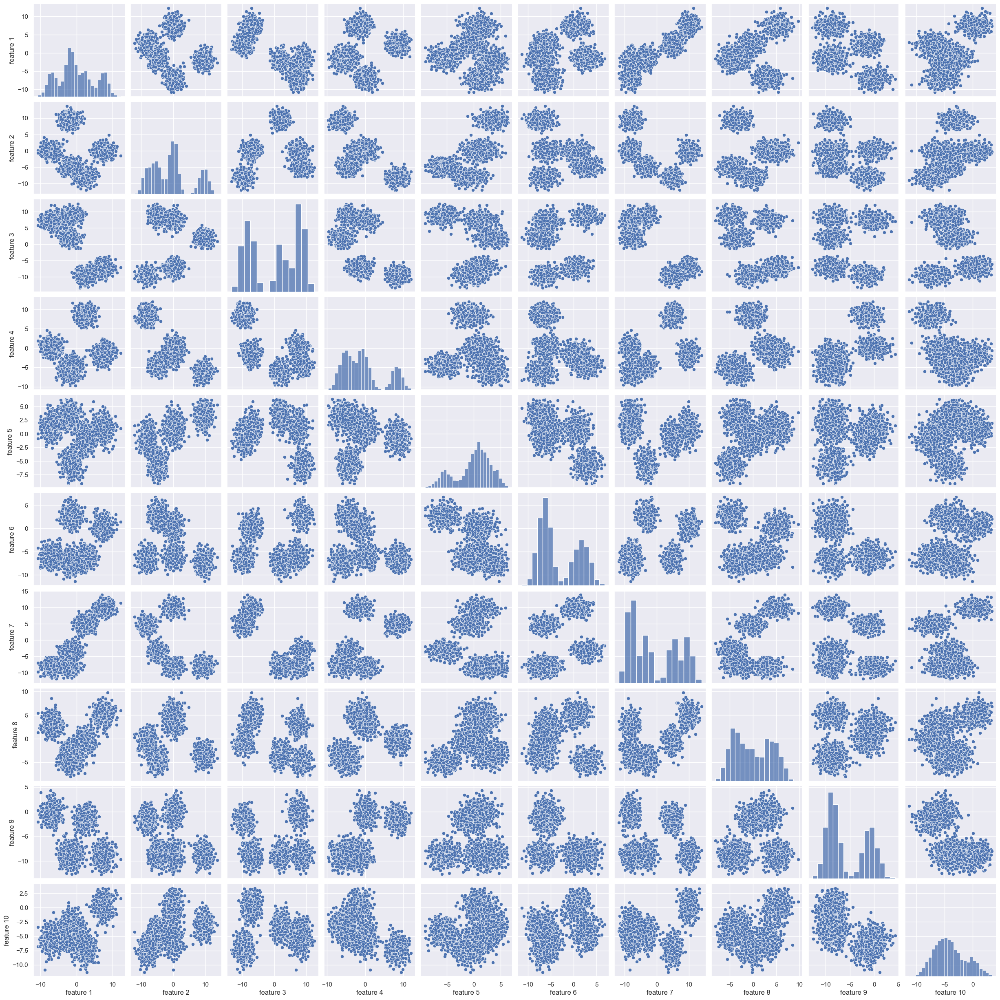

In [11]:
sns.pairplot(df)

# KMeans

## Elbow Method

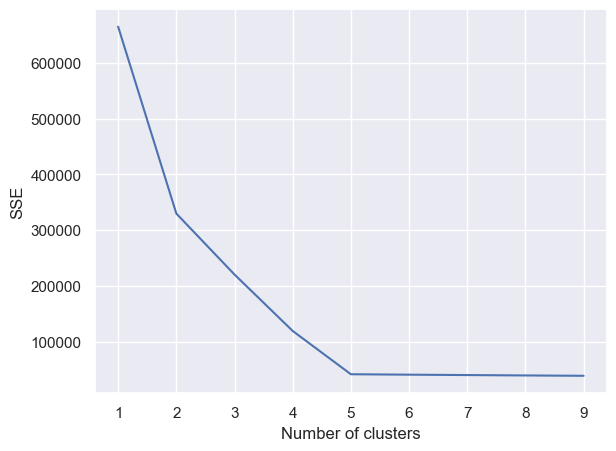

In [12]:
data = df
sse = {}
for k in range(1, 10):
    kmeans = KMeans(n_clusters=k, max_iter=1000).fit(data)
    data["clusters"] = kmeans.labels_
    sse[k] = kmeans.inertia_ # Inertia: Sum of distances of samples to their closest cluster center
fig = plt.figure()
ax = fig.add_axes([0.1, 0.1, 0.8, 0.8])
ax.plot(list(sse.keys()), list(sse.values()))
ax.set_xlabel("Number of clusters")
ax.set_ylabel("SSE")
ax.set_xticks(list(sse.keys()))
# ax.set_yticks(list(sse.values()))
plt.show()

## Silhouette Method

<Axes: >

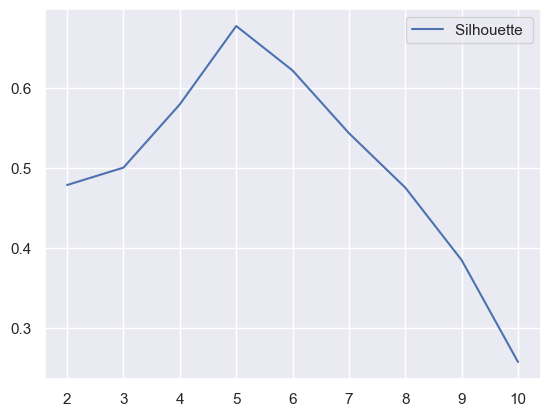

In [13]:
sil = []
kmax = 10
# dissimilarity would not be defined for a single cluster, thus, minimum number of clusters should be 2
for k in range(2, kmax+1):
  kmeans = KMeans(n_clusters = k).fit(df)
  labels = kmeans.labels_
  sil.append(silhouette_score(data, labels, metric = 'euclidean'))
pd.DataFrame(index=range(2, kmax+1), data={"Silhouette ":sil}).plot()

As discussed in the lectures, The plot shows that a value of 5 centroids is most fitting.

## KMEANS Run

In [14]:
NUMBER_OF_CENTROIDS = 5

In [15]:
kmeans = KMeans(n_clusters=NUMBER_OF_CENTROIDS, random_state=0, n_init="auto").fit(df.values)

In [16]:
classes = kmeans.labels_

In [17]:
Counter(classes)

Counter({3: 500, 2: 500, 4: 500, 0: 500, 1: 500})

In [18]:
guessed_classes_kmeans_df = df.copy()
guessed_classes_kmeans_df["class"] = classes

### KMeans Clustering Output Vizualization

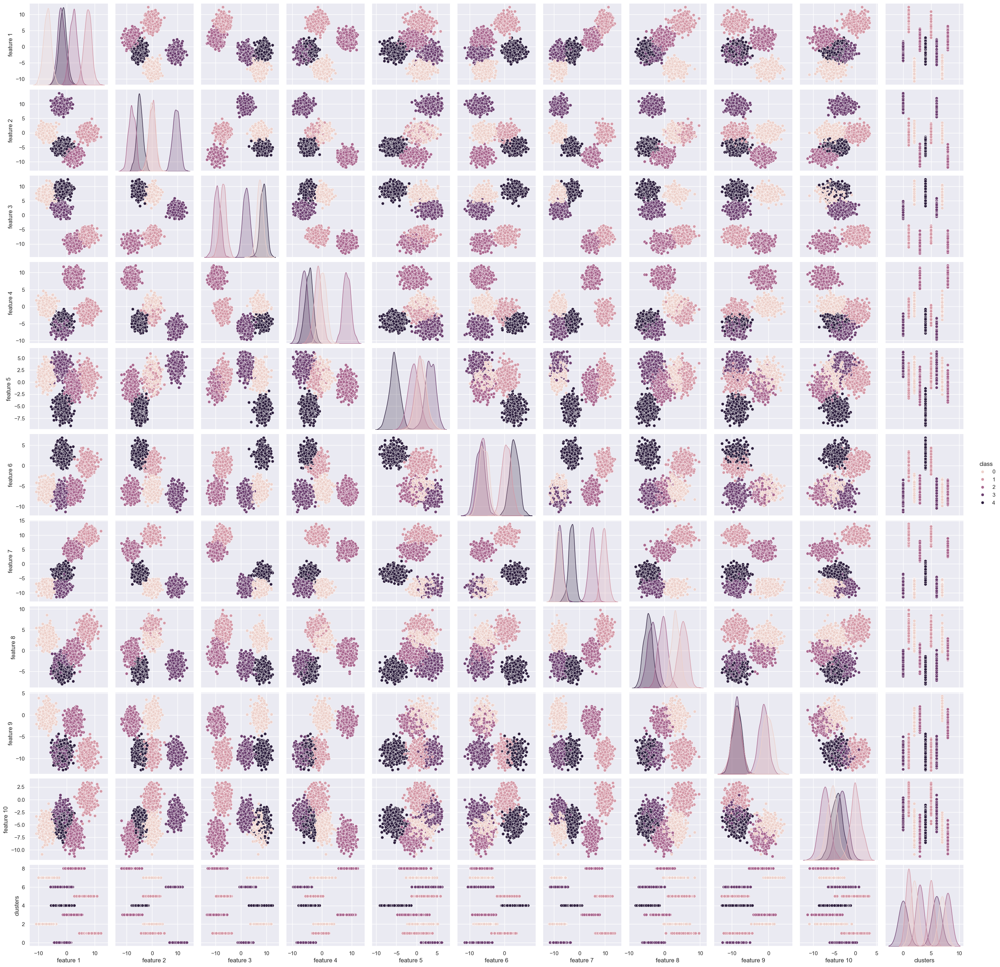

In [19]:
sns.pairplot(guessed_classes_kmeans_df, hue="class")

# DBSCAN

Based on [this](https://www.sefidian.com/2022/12/18/how-to-determine-epsilon-and-minpts-parameters-of-dbscan-clustering/) the epsilon and min_points were set.
<br>Also based on: https://medium.com/@tarammullin/dbscan-parameter-estimation-ff8330e3a3bd

In [20]:
DBSCAN_MIN_SAMPLES = 10 + 1

In [21]:
data = df.copy()

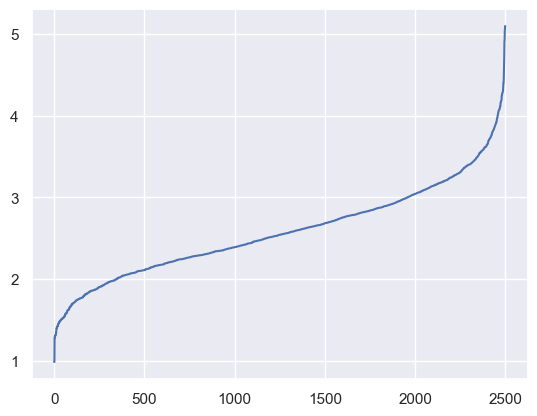

In [22]:
neighbors = NearestNeighbors(n_neighbors=DBSCAN_MIN_SAMPLES)
neighbors_fit = neighbors.fit(data)
distances, indices = neighbors_fit.kneighbors(data)
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.plot(distances)

The plateau point we have chosen is 3.3

In [23]:
DBSCAN_EPS = 3.3

In [24]:
db_scan = DBSCAN(eps=DBSCAN_EPS, min_samples=DBSCAN_MIN_SAMPLES)
db_scan.fit(df.values)

DBSCAN(eps=3.3, min_samples=11)

In [25]:
classes = db_scan.labels_

In [26]:
Counter(classes)

Counter({0: 211,
         8: 188,
         -1: 456,
         2: 436,
         5: 201,
         1: 226,
         6: 175,
         3: 221,
         4: 216,
         7: 170})

In [27]:
df["class"] = classes
guessed_classes_dbscan_df = df

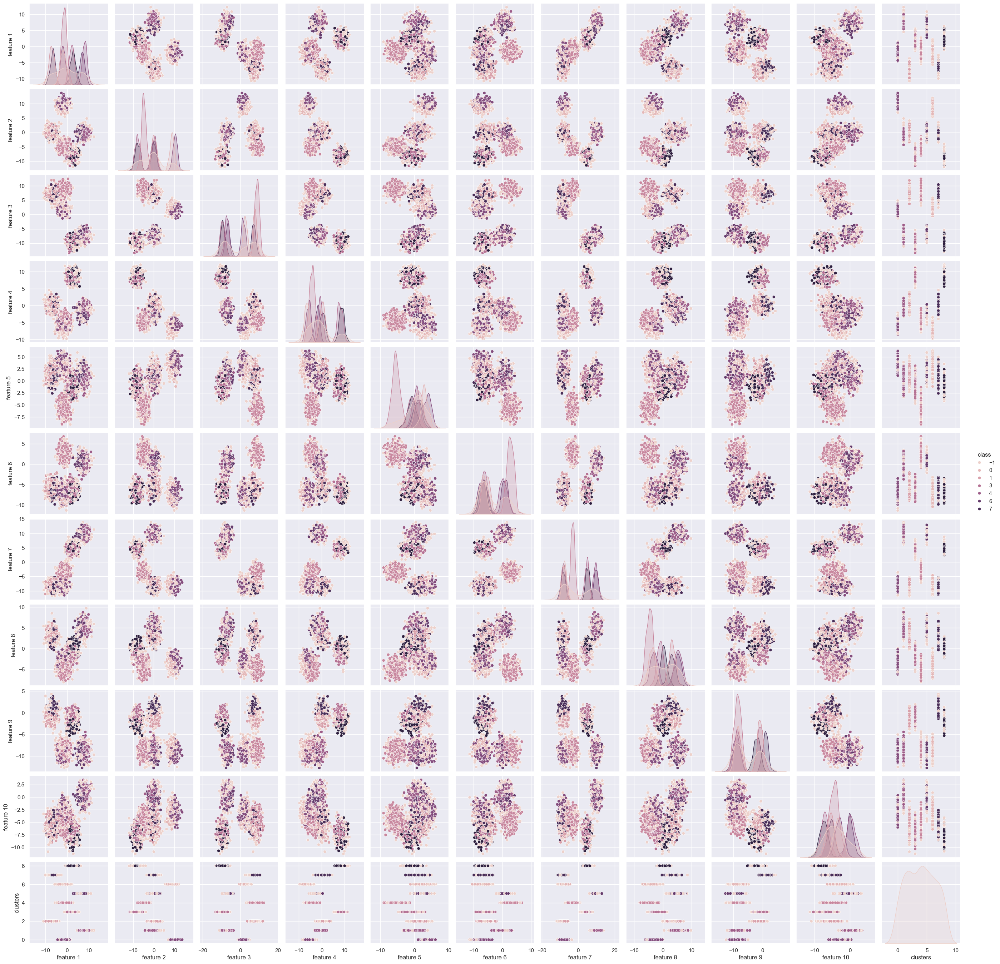

In [28]:
sns.pairplot(guessed_classes_dbscan_df, hue="class")

# Comparing the two

In order to compare the two unlabeled clustering methods, we'll examine 3 metrics: <br> (1) Sihluette Score - higher is better - interpretation and validation of consistency within clusters of data.
<br> (2) DB score - lower is better - average similarity measure of each cluster with the cluster most similar to it.
<br> (3) Carlinski Harabasz score - higher is better -  variance ratio criterion.

In [29]:
clustering_methods = {
    'KMeans': KMeans(n_clusters=NUMBER_OF_CENTROIDS, random_state=0),
    'DBSCAN': DBSCAN(eps=DBSCAN_EPS, min_samples=DBSCAN_MIN_SAMPLES)
}
clustering_metrics = {
    'Silhouette Score': silhouette_score,
    'Davies-Bouldin Score': davies_bouldin_score,
    'Calinski-Harabasz Score': calinski_harabasz_score
}
clustering_metrics_is_higher_better = {
    'Silhouette Score': True,
    'Davies-Bouldin Score': False,
    'Calinski-Harabasz Score': True,
}
# Create an empty DataFrame to store results
results_df = pd.DataFrame(index=clustering_metrics.keys(), columns=clustering_methods.keys())
# Iterate over each clustering method
for method_name, method in clustering_methods.items():
    clusters = method.fit_predict(df.values)
    for metric_name, metric_func in clustering_metrics.items():
        score = metric_func(df.values, clusters)
        results_df.loc[metric_name, method_name] = score
print(results_df)

                              KMeans      DBSCAN
Silhouette Score            0.641549    0.281808
Davies-Bouldin Score        0.572666    1.270823
Calinski-Harabasz Score  5387.653524  955.621202


#### Graphical Representation

The results are on different scales - normalize each one by the maximum

In [30]:
res_df = results_df.apply(lambda x: x/x.max(), axis=1)

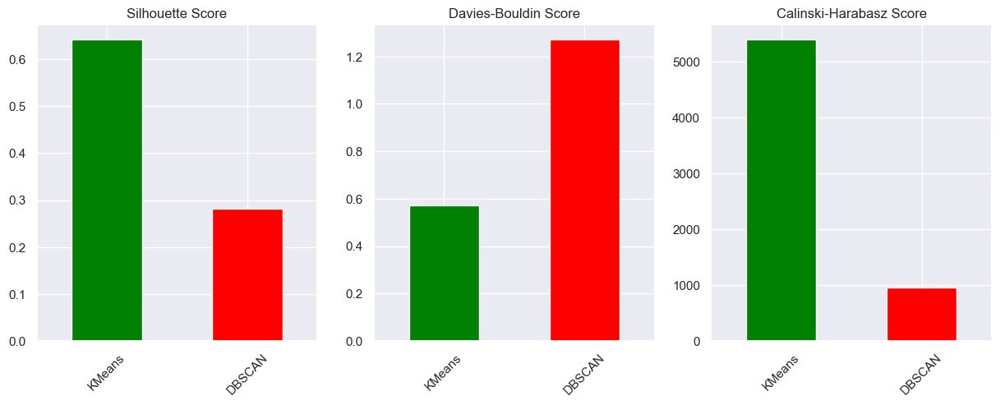

In [31]:
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
for score_ind, score in enumerate(results_df.index):
  results_df.loc[score].plot.bar(ax=axes[score_ind], rot=45, color=["green", "red"], title=score)

As is can be seen in the barplot, a "good" value for a metric is in green and a "bad" one is colored in red. <br>Across these 3 chosen metrics, for this dataset, *Kmeans seems be more fitting*.
<br>This may imply that the data originated from 5 centroids, and there is no definitive need for non convex cluster definitions, that DBSCAN provides.